In [1]:
%cd yolov5/
%pip install -r requirements.txt

c:\Users\user\Desktop\cv_homework\yolov5
Note: you may need to restart the kernel to use updated packages.


In [25]:
import torch
import utils
display = utils.notebook_init()

YOLOv5  v7.0-295-gac6c4383 Python-3.9.13 torch-2.2.2+cpu CPU


Setup complete  (8 CPUs, 15.3 GB RAM, 197.1/281.0 GB disk)


In [8]:
!python detect.py --weights yolov5/yolov5m.pt --img 640 --conf 0.25 --source data/images

detect: weights=['yolov5/yolov5m.pt'], source=data/images, data=data\coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-295-gac6c4383 Python-3.9.13 torch-2.2.2+cpu CPU


  0%|          | 0.00/40.8M [00:00<?, ?B/s]
  0%|          | 64.0k/40.8M [00:00<01:11, 597kB/s]
  1%|          | 240k/40.8M [00:00<00:35, 1.19MB/s]
  1%|          | 360k/40.8M [00:00<00:37, 1.14MB/s]
  1%|▏         | 528k/40.8M [00:00<00:35, 1.20MB/s]
  2%|▏         | 648k/40.8M [00:00<00:35, 1.19MB/s]
  2%|▏         | 768k/40.8M [00:00<00:42, 987kB/s] 
  2%|▏         | 872k/40.8M [00:00<00:52, 798kB/s]
  2%|▏         | 960k/40.8M [00:01<01:04, 648kB/s]
  2%|▏   

In [2]:
!python train.py --img 640 --batch -1 --epochs 1 --data datasets/carsnumber/dataset.yaml --weights yolov5/yolov5m.pt --cache

train: weights=yolov5/yolov5m.pt, cfg=, data=../datasets/carsnumber/dataset.yaml, hyp=data\hyps\hyp.scratch-low.yaml, epochs=1, batch_size=-1, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data\hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs\train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest, ndjson_console=False, ndjson_file=False
github: up to date with https://github.com/ultralytics/yolov5 
YOLOv5  v7.0-295-gac6c4383 Python-3.9.13 torch-2.2.2+cpu CPU

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=

In [23]:
!python detect.py --source datasets/carsnumber/test/images/screenshot_1664704636694.png --weights runs/train/exp/weights/best.pt --img 896 --save-txt --save-crop

detect: weights=['runs/train/exp/weights/best.pt'], source=../datasets/carsnumber/test/images/screenshot_1664704636694.png, data=data\coco128.yaml, imgsz=[896, 896], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_csv=False, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs\detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5  v7.0-295-gac6c4383 Python-3.9.13 torch-2.2.2+cpu CPU

Fusing layers... 
Model summary: 157 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
image 1/1 C:\Users\user\Desktop\cv_homework\datasets\carsnumber\test\images\screenshot_1664704636694.png: 512x896 4 persons, 3 cars, 1 bus, 389.1ms
Speed: 2.2ms pre-process, 389.1ms inference, 3.0ms NMS per image at shape (1, 3, 896, 896)
Results saved to runs\detect\exp23
1 labels saved to runs\detect\exp23\label

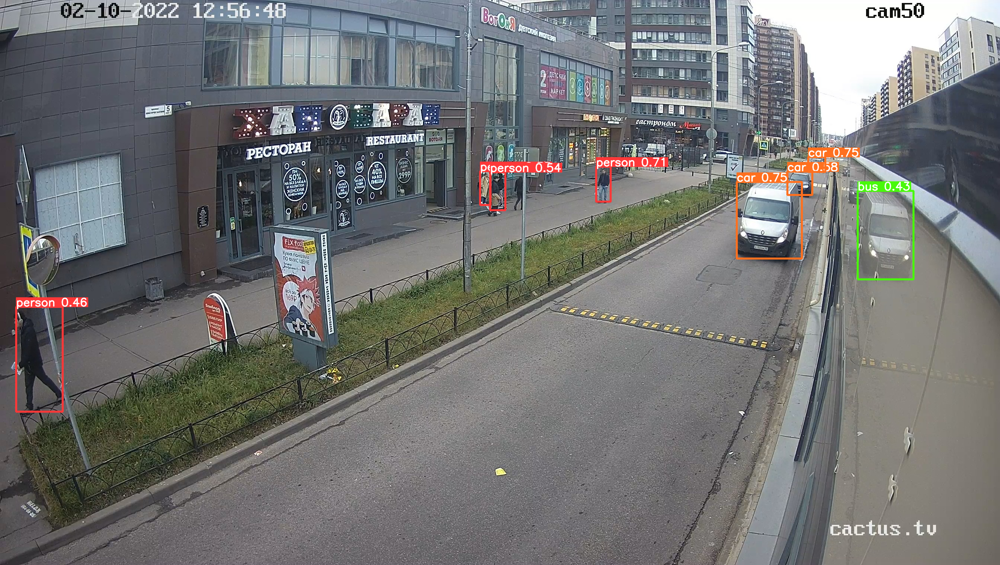

In [27]:
display.Image(filename='runs/detect/exp23/screenshot_1664704636694.png', width=1000)

In [34]:
from ultralytics import YOLO
import os

model = YOLO('yolov5nu.pt')

results = model.train(data='datasets/carsnumber/carsnumber.yaml', epochs=10, imgsz=640)

names = os.listdir('datasets/carsnumber/test/images')
images = []
for x in names:
    images.append(os.path.join("datasets/carsnumber/test/images", x))

results = model(images)

for result in results:
    boxes = result.boxes
    masks = result.masks
    keypoints = result.keypoints
    probs = result.probs
    result.show()

New https://pypi.org/project/ultralytics/8.1.42 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.1.37 🚀 Python-3.9.13 torch-2.2.2+cpu CPU (AMD Ryzen 3 5300U with Radeon Graphics)
engine\trainer: task=detect, mode=train, model=yolov5nu.pt, data=datasets/carsnumber/carsnumber.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=

train: Scanning C:\Users\user\Desktop\cv_homework\yolov5\datasets\carsnumber\train\labels.cache... 362 images, 0 backgrounds, 0 corrupt: 100%|██████████| 362/362 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



val: Scanning C:\Users\user\Desktop\cv_homework\yolov5\datasets\carsnumber\val\labels.cache... 80 images, 0 backgrounds, 0 corrupt: 100%|██████████| 80/80 [00:00<?, ?it/s]

Plotting labels to runs\detect\train7\labels.jpg... 


optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train7
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      1.002      2.741      1.074        100        640: 100%|██████████| 23/23 [02:39<00:00,  6.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:15<00:00,  5.08s/it]

                   all         80        231      0.549      0.327      0.369      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G     0.9867      1.702      1.053         86        640: 100%|██████████| 23/23 [02:38<00:00,  6.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.60s/it]

                   all         80        231      0.989       0.12      0.646      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G     0.9873      1.494      1.058         71        640: 100%|██████████| 23/23 [02:37<00:00,  6.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:11<00:00,  3.95s/it]

                   all         80        231      0.957      0.247      0.644      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G     0.9603      1.326       1.04         43        640: 100%|██████████| 23/23 [02:34<00:00,  6.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.47s/it]

                   all         80        231      0.755      0.588      0.691      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G     0.9392      1.256      1.012         35        640: 100%|██████████| 23/23 [02:31<00:00,  6.61s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.62s/it]

                   all         80        231      0.781      0.626      0.726      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G     0.9431      1.173      1.009         51        640: 100%|██████████| 23/23 [02:34<00:00,  6.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.63s/it]

                   all         80        231      0.901      0.743      0.856      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G     0.9316      1.121      1.011         45        640: 100%|██████████| 23/23 [02:33<00:00,  6.67s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:11<00:00,  3.72s/it]

                   all         80        231      0.866      0.734      0.822      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G     0.8824      1.062     0.9792         26        640: 100%|██████████| 23/23 [02:38<00:00,  6.88s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.63s/it]

                   all         80        231      0.902      0.773      0.859      0.666



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G     0.8506          1     0.9648         31        640: 100%|██████████| 23/23 [03:01<00:00,  7.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:15<00:00,  5.16s/it]

                   all         80        231      0.915      0.769      0.869       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G     0.8346     0.9505     0.9543         82        640: 100%|██████████| 23/23 [02:54<00:00,  7.58s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:14<00:00,  4.70s/it]

                   all         80        231      0.947      0.797      0.884       0.69



10 epochs completed in 0.485 hours.
Optimizer stripped from runs\detect\train7\weights\last.pt, 5.3MB
Optimizer stripped from runs\detect\train7\weights\best.pt, 5.3MB

Validating runs\detect\train7\weights\best.pt...
Ultralytics YOLOv8.1.37 🚀 Python-3.9.13 torch-2.2.2+cpu CPU (AMD Ryzen 3 5300U with Radeon Graphics)
YOLOv5n summary (fused): 193 layers, 2503529 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:10<00:00,  3.54s/it]


                   all         80        231      0.944      0.797      0.884       0.69
                   car         80        110      0.885      0.882      0.924      0.779
                 plate         80         99      0.995      0.646      0.778      0.548
                 truck         80         22      0.953      0.864      0.951      0.744
Speed: 1.6ms preprocess, 87.6ms inference, 0.0ms loss, 3.2ms postprocess per image
Results saved to runs\detect\train7

0: 384x640 1 truck, 67.6ms
1: 384x640 2 cars, 1 truck, 67.6ms
2: 384x640 2 cars, 1 plate, 67.6ms
3: 384x640 3 cars, 67.6ms
4: 384x640 3 cars, 1 plate, 67.6ms
5: 384x640 3 cars, 67.6ms
6: 384x640 3 cars, 67.6ms
7: 384x640 3 cars, 2 plates, 67.6ms
8: 384x640 3 cars, 2 plates, 67.6ms
9: 384x640 2 cars, 1 plate, 67.6ms
Speed: 3.3ms preprocess, 67.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


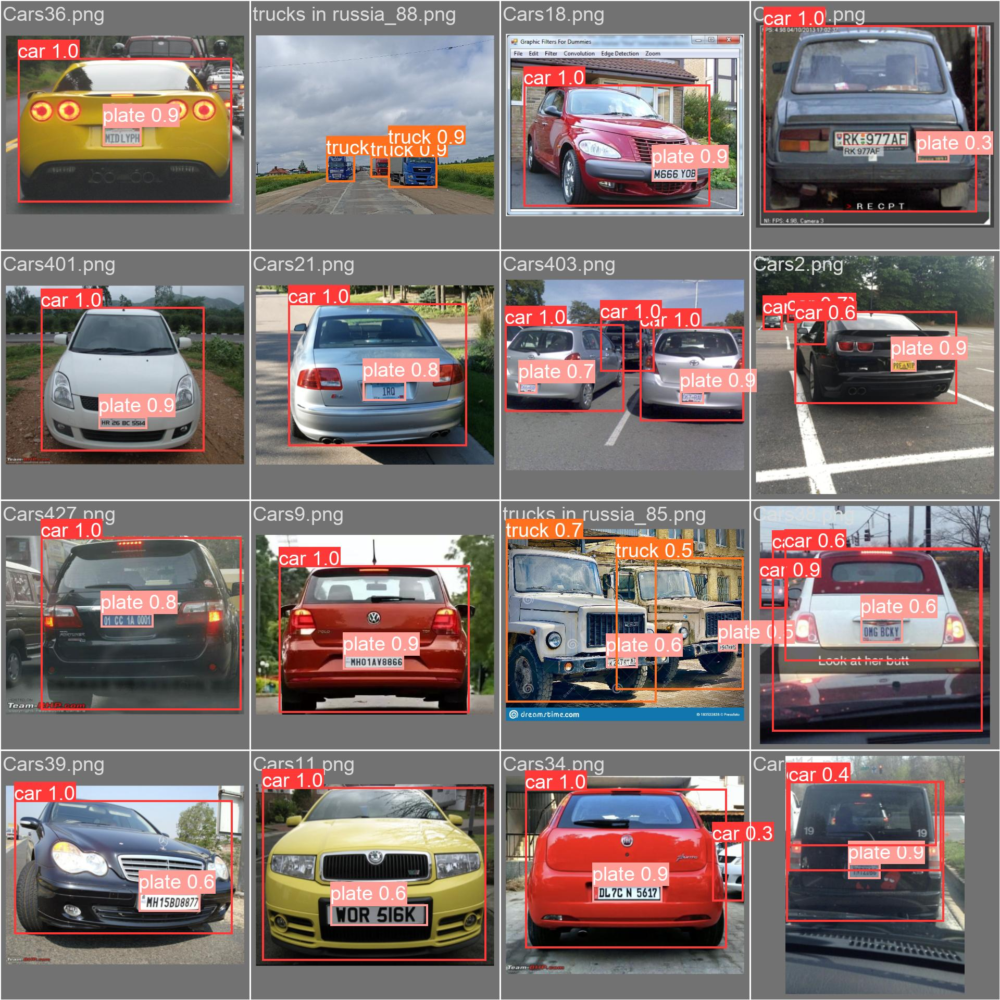

In [36]:
display.Image("runs\\detect\\train7\\val_batch2_pred.jpg")

In [ ]:
from ultralytics import YOLO
import os

model = YOLO('yolov5nu.pt')

results = model.train(data='datasets/prw/prw.yaml', epochs=10, imgsz=640)

names = os.listdir('datasets/prw/test/images')
images = []
for x in names:
    images.append(os.path.join("datasets/prw/test/images", x))

results = model(images)

for result in results:
    boxes = result.boxes
    masks = result.masks
    keypoints = result.keypoints
    probs = result.probs
    result.show()

In [ ]:
import scipy.io
import os

# Path to the directory containing MATLAB annotations (.mat files)
mat_annotations_dir = "path/to/mat_annotations"

# Path to the directory containing images
image_dir = "path/to/images"

# Output directory for YOLO annotations
yolo_annotations_dir = "path/to/yolo_annotations"
if not os.path.exists(yolo_annotations_dir):
    os.makedirs(yolo_annotations_dir)

# Load MATLAB annotations
for filename in os.listdir(mat_annotations_dir):
    if filename.endswith(".mat"):
        filepath = os.path.join(mat_annotations_dir, filename)
        mat = scipy.io.loadmat(filepath)
        
        # Extract bounding box coordinates
        bbox_data = mat['box_new']
        
        # Convert to YOLO format and save annotations
        with open(os.path.join(yolo_annotations_dir, filename.replace('.mat', '.txt')), 'w') as f:
            for bbox in bbox_data:
                # Calculate YOLO format coordinates (x_center, y_center, width, height)
                x_center = (bbox[0] + bbox[2] / 2) / image_width
                y_center = (bbox[1] + bbox[3] / 2) / image_height
                width = bbox[2] / image_width
                height = bbox[3] / image_height
                
                # Write annotation to file
                f.write(f"0 {x_center} {y_center} {width} {height}\n")


In [44]:
import scipy.io
mat = scipy.io.loadmat("C:\\Users\\user\\Desktop\\cv_homework\\PRW\\PRW-v16.04.20\\annotations\\c1s1_000376.jpg.mat")
mat['box_new']

array([[          3,      1022.3,      412.21,      51.317,      167.95],
       [          4,      1339.5,      486.85,      130.63,      275.25],
       [          5,      1134.3,      444.86,      170.28,      401.21]])

In [55]:
values = mat['box_new']

with open("234567890098765433456789.txt", "w") as output:
    output.write(str(values))